In [1]:
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import scanpy as sc
import anndata
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sys
import seaborn as sns
from itertools import chain
#only needed  in development
import importlib # use like this: importlib.reload(typing_comparison.utils)

In [4]:
sys.path.insert(1, '/secure/projects/HTAPP_MBC/src/spatial')
from spatial_utils import *

In [5]:
sample="HTAPP-880-SMP-7179"

In [6]:
#These identifiers are set as defaults in many functions. If names are changed, this has to be adapted when calling the functions.
ct_column='cell_type'
sm_methods=["slide_seq","merfish","merfish_bin",'exseq','exseq_bin',"codex"] #spatial mathod names are hard-coded for now because some methods need special treatments. Can be fixed by giving eatch method it's own variable.
sc_method="scRNAseq"
he_method="HE_highres"
all_methods=[sc_method,*sm_methods,he_method]
all_methods

['scRNAseq',
 'slide_seq',
 'merfish',
 'merfish_bin',
 'exseq',
 'exseq_bin',
 'codex',
 'HE_highres']

In [7]:
out_dir=out_dir_base+sample
os.makedirs(out_dir, exist_ok=True)

## Align and prep data

In [8]:
#get the data without processing (Filter: min_genes=30 min_cells=3 but further reduce low count obs if more than 35%)
adatas=get_and_process_data(sample,data_dir,out_dir,methods=all_methods,process=False)

reading  scRNAseq  from buffer
reading  slide_seq  from buffer
reading  merfish  from buffer
reading  merfish_bin  from buffer
reading  exseq  from buffer
reading  exseq_bin  from buffer
reading  codex  from buffer
Loading processed HE_highres
Loading processed HE_highres


In [9]:
#select colors for single cell
sel_colors=colors[colors.index.isin(adatas[sc_method].obs[ct_column])]
adatas[sc_method].obs[ct_column]=pd.Categorical(adatas[sc_method].obs[ct_column], categories=sel_colors.index,ordered=True)
adatas[sc_method].uns[ct_column+"_colors"]=list(sel_colors.values)

In [26]:
#Note: the pre-applied HE scaling factor is 0.4 per default. Take this into account to align to a differently scaled HE. 

registration=pd.DataFrame(index=[i for i in list(replicate_splitter(adatas).index) if not (sc_method in i)] , 
                          columns=["crop_left","crop_right","crop_top","crop_bottom","scale","shift_x","shift_y","degrees"])
#HE 1
registration.loc["HE 1","crop_left"]=0
registration.loc["HE 1","crop_right"]=0
registration.loc["HE 1","crop_top"]=0
registration.loc["HE 1","crop_bottom"]=0
registration.loc["HE 1","scale"]=0.6905#0.67
registration.loc["HE 1","degrees"]=0


#HE 2
registration.loc["HE 2","crop_left"]=860#815
registration.loc["HE 2","crop_right"]=300
registration.loc["HE 2","crop_top"]=300
registration.loc["HE 2","crop_bottom"]=520#475
registration.loc["HE 2","scale"]=0.6905#0.67
registration.loc["HE 2","degrees"]=17#15


#Annotation HE 1
registration.loc["HE 1 annot","crop_left"]=-40
registration.loc["HE 1 annot","crop_right"]=0
registration.loc["HE 1 annot","crop_top"]=0
registration.loc["HE 1 annot","crop_bottom"]=0
registration.loc["HE 1 annot","scale"]=registration.loc["HE 1","scale"]/0.67
registration.loc["HE 1 annot","degrees"]=0


#Annotation HE 2
registration.loc["HE 2 annot","crop_left"]=registration.loc["HE 2","crop_left"]-815
registration.loc["HE 2 annot","crop_right"]=0
registration.loc["HE 2 annot","crop_top"]=0
registration.loc["HE 2 annot","crop_bottom"]=registration.loc["HE 2","crop_bottom"]-475
registration.loc["HE 2 annot","scale"]=registration.loc["HE 2","scale"]/0.67
registration.loc["HE 2 annot","degrees"]=registration.loc["HE 2","degrees"]-15


#slide_seq 1
registration.loc["slide_seq 1","shift_x"]=-50
registration.loc["slide_seq 1","shift_y"]=555
registration.loc["slide_seq 1","degrees"]=271

#slide_seq 2
registration.loc["slide_seq 2","shift_x"]=-140
registration.loc["slide_seq 2","shift_y"]=205
registration.loc["slide_seq 2","degrees"]=177

#merfish 2
registration.loc["merfish 2","shift_x"]=-945
registration.loc["merfish 2","shift_y"]=625
registration.loc["merfish 2","degrees"]=132

#merfish_bin 2
registration.loc["merfish_bin 2","shift_x"]=-1005
registration.loc["merfish_bin 2","shift_y"]=325
registration.loc["merfish_bin 2","degrees"]=130

#exseq 2
registration.loc["exseq 2","shift_x"]=430
registration.loc["exseq 2","shift_y"]=1300
registration.loc["exseq 2","degrees"]=85

#exseq_bin 2
registration.loc["exseq_bin 2","shift_x"]=430
registration.loc["exseq_bin 2","shift_y"]=1300
registration.loc["exseq_bin 2","degrees"]=85


#codex 2
registration.loc["codex 2","shift_x"]=-350
registration.loc["codex 2","shift_y"]=400
registration.loc["codex 2","degrees"]=76

reg_file=out_dir+"/"+sample+"_registration.csv"
if os.path.isfile(reg_file)&False:
    print("Reading registation.")
    registration=pd.read_csv(reg_file,index_col=0)
else:
    print("Writing registration.")
    registration.to_csv(reg_file)

Writing registration.


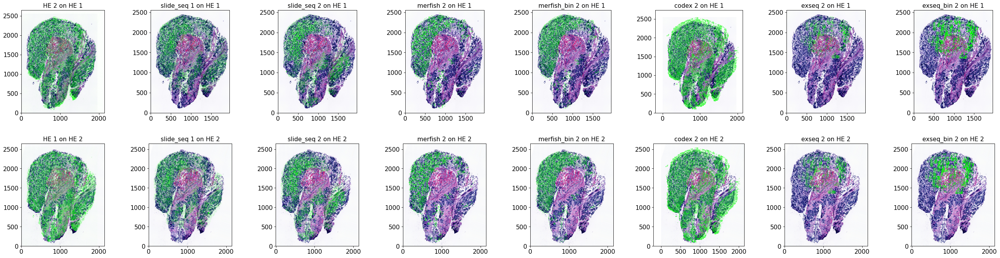

In [33]:
aligner(adatas,img_idx="HE 1",img_idx2="HE 2",dat_idxs=["slide_seq 1","slide_seq 2","merfish 2","merfish_bin 2","codex 2","exseq 2","exseq_bin 2"],registration=registration,dot_sizes=[5,1.5,0.9,0.05,0.5,2,1],figsize=(42,10),adjust=False,change=True)

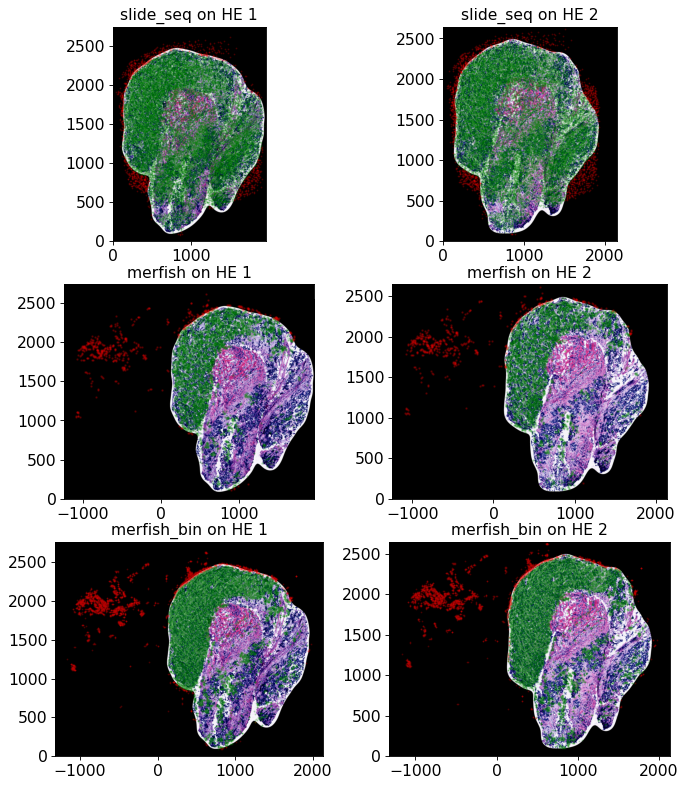

In [12]:
create_mask(adatas, ["HE 1","HE 2"],dat_idxs=["slide_seq","merfish","merfish_bin"],figsize=(10,12),dot_sizes=[0.5,1.5,0.5],s=60,t=0.8)

In [34]:
add_annotations(adatas,sample,dat_idxs=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"],registration=registration)

ImmuneCells
Fibrosis
Vasculature
Tumor
Unidentifiable
Unidentifiable
Tumor
ImmuneCells
Vasculature
Fibrosis


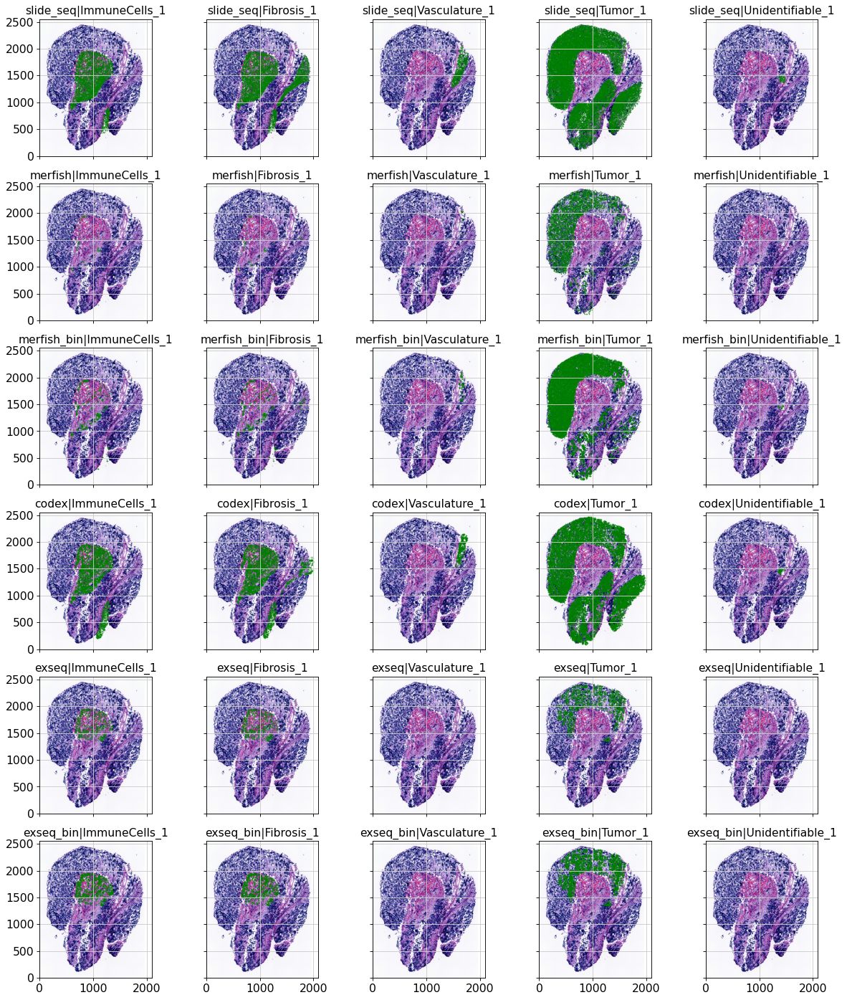

In [38]:
plot_annnotation(adatas,dat_idxs=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"],annots=["ImmuneCells_1","Fibrosis_1","Vasculature_1","Tumor_1","Unidentifiable_1"],figsize=[18,22],HE="HE 1")

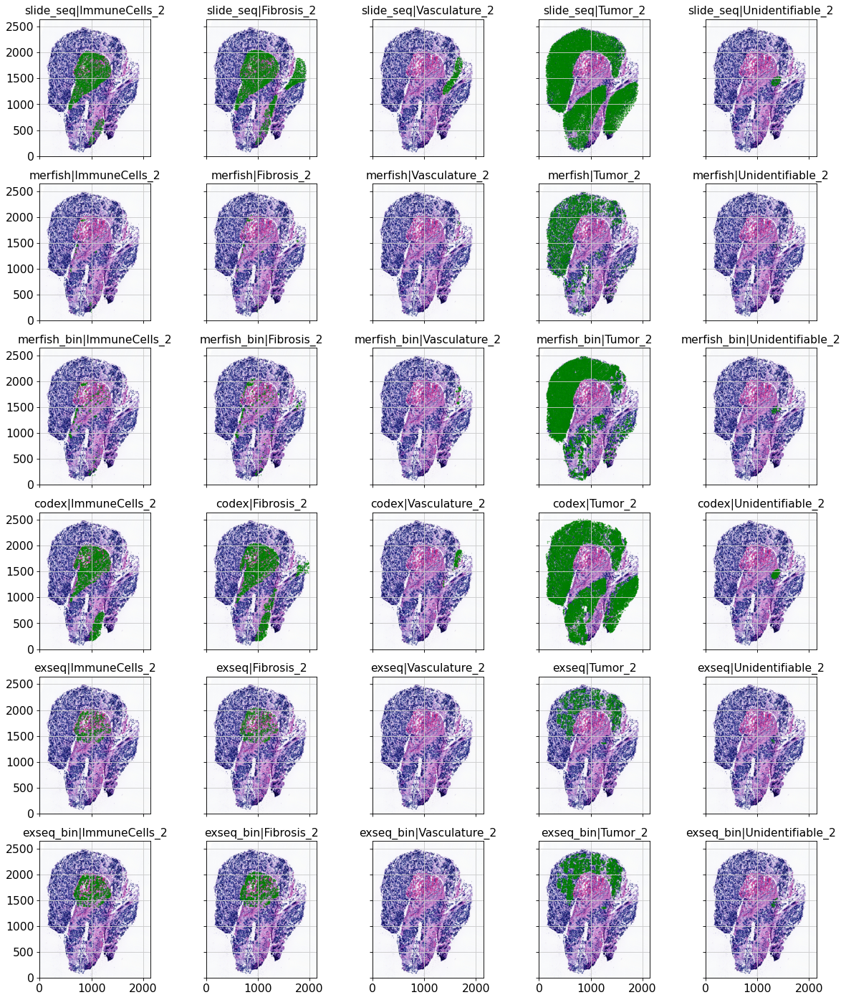

In [39]:
plot_annnotation(adatas,dat_idxs=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"],annots=["ImmuneCells_2","Fibrosis_2","Vasculature_2","Tumor_2","Unidentifiable_2"],figsize=[18,22],HE="HE 2")

In [21]:
adatas=update_processed_adatas(adatas,sample,out_dir,all_methods,overwrite=True,process=True)

Processing scRNAseq
No HE masks found. Not trimming data.


Trying to set attribute `.obs` of view, copying.


Processing slide_seq


Trying to set attribute `.obs` of view, copying.


Processing merfish


Trying to set attribute `.obs` of view, copying.


Processing merfish_bin
Processing codex
No HE masks found. Not trimming data.
Normalization turned off.


In [40]:
adatas=update_processed_adatas(adatas,sample,out_dir,["exseq","exseq_bin"],overwrite=True,process=True)

Processing exseq
No HE masks found. Not trimming data.
Processing exseq_bin
No HE masks found. Not trimming data.


## Load the processed data

In [41]:
adatas=get_and_process_data(sample,data_dir,out_dir,methods=all_methods)

reading  scRNAseq  from buffer
reading  slide_seq  from buffer
reading  merfish  from buffer
reading  merfish_bin  from buffer
reading  exseq  from buffer
reading  exseq_bin  from buffer
reading  codex  from buffer
Loading processed HE_highres
Loading processed HE_highres


## Look at the data

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


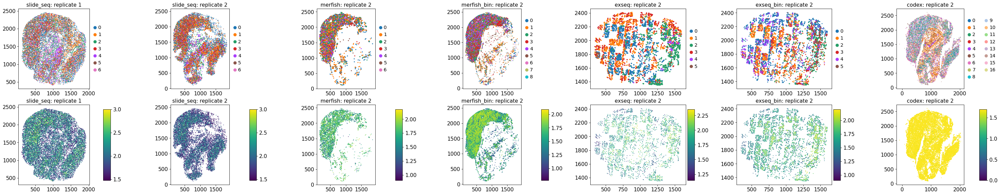

In [47]:
plot_spatial_obs(adatas,sm_methods,axsize=(4,3),wspace=0.15,x_shifts=[0,-0.02])

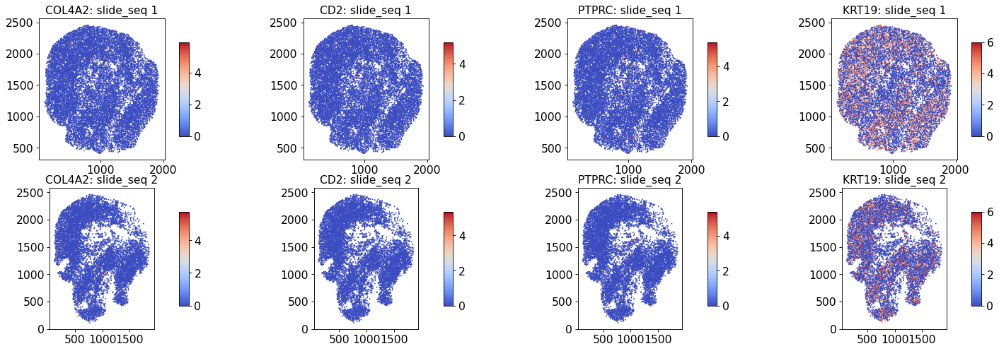

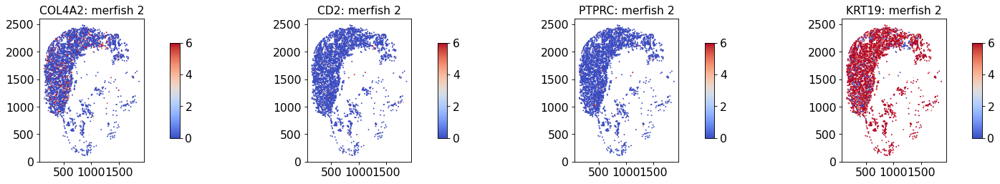

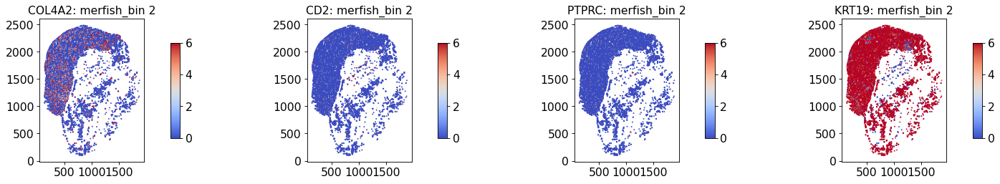

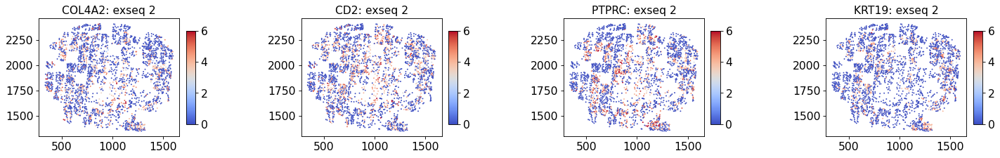

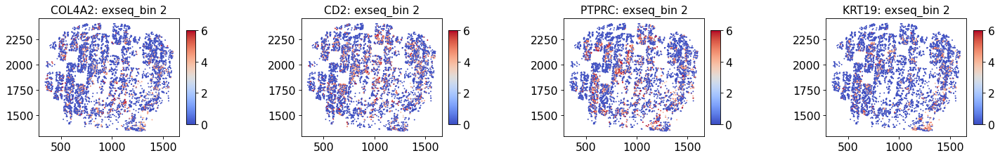

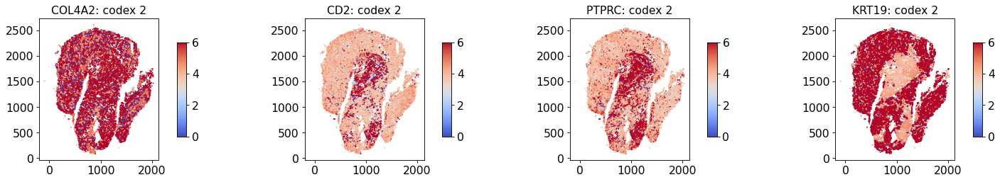

In [48]:
plot_spatial_genes(adatas,methods=sm_methods,genes = ["COL4A2","CD2","PTPRC","KRT19"],axsize=(2.5,2.5));

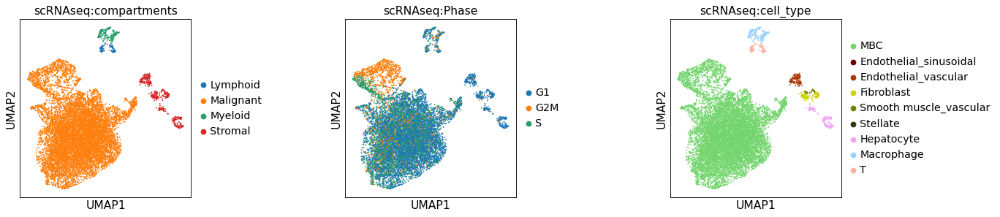

In [25]:
plot_variable_individual(adatas,method_vars=[("scRNAseq","compartments"),("scRNAseq","Phase"),("scRNAseq","cell_type")])

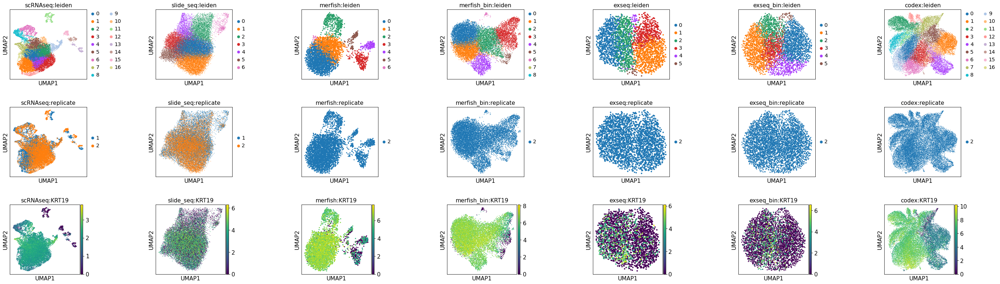

In [49]:
plot_variable_grid(adatas,methods=[sc_method,*sm_methods],variables=['leiden','replicate','KRT19'])

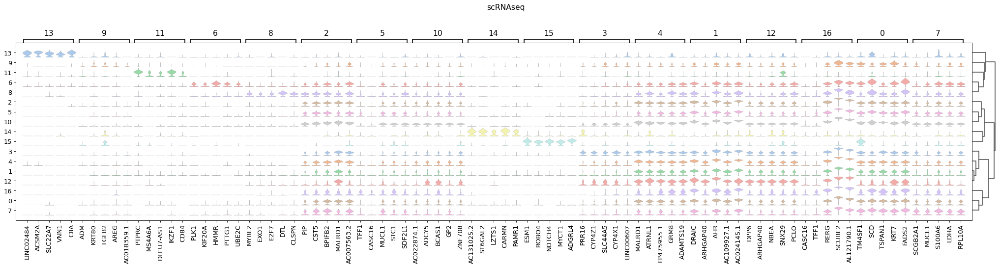

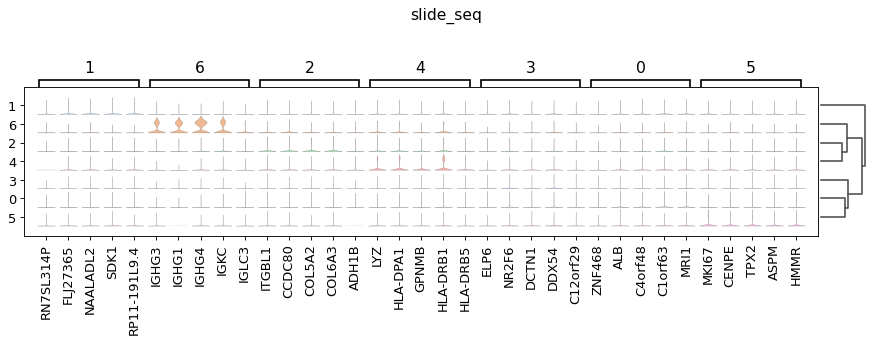

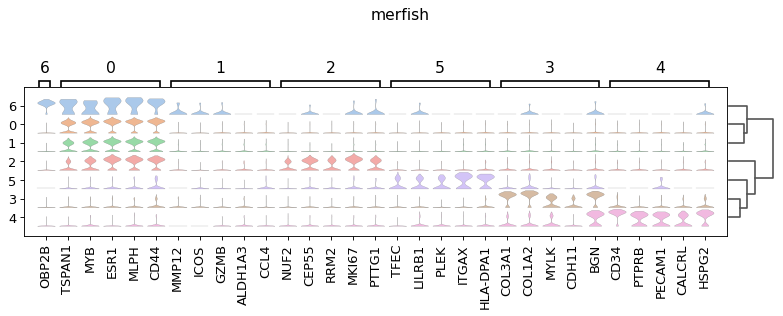

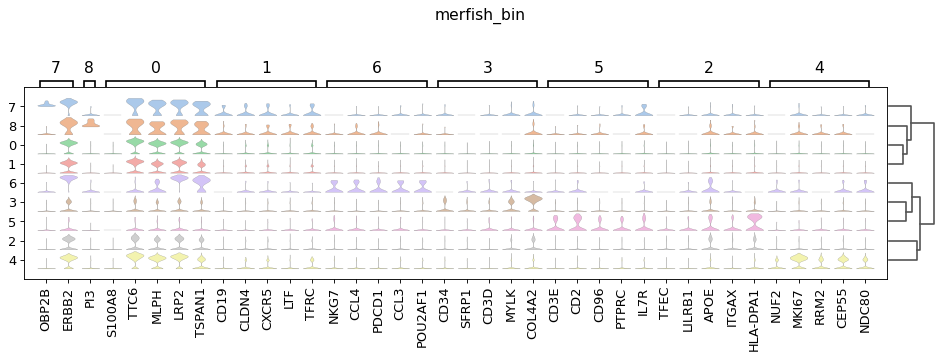

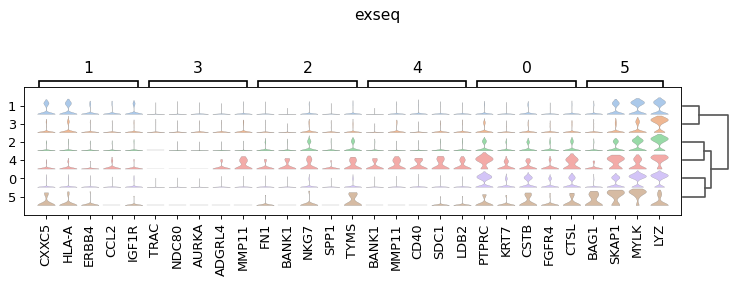

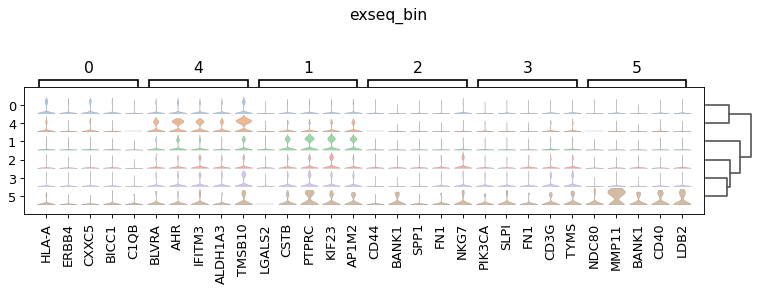

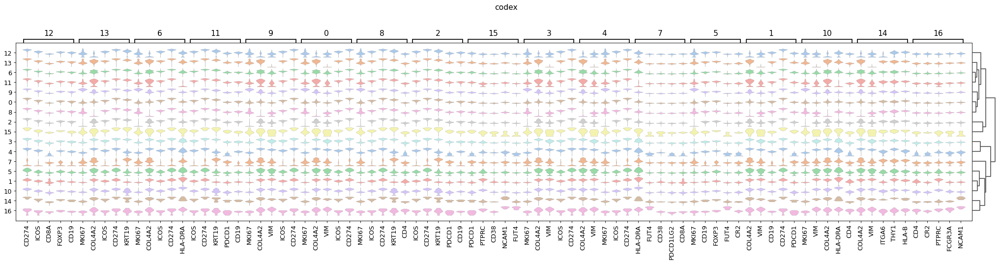

In [50]:
get_sub_markers(adatas,methods=[sc_method,*sm_methods],rest_thres=1)